earthaccess keys
Imagery: VNP02IMG + geolocation VNP03IMG
Moderate: VNP02MOD + geolocation VNP03MOD
Day-night band: VNP02DNB + geolocation VNP03DNB


In [1]:
from satpy.scene import Scene
from glob import glob
import urllib
import earthaccess

/home/jovyan/.conda/envs/sea-ice-oscillations/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# functions to download data (just organizing stuff)
def get_vnp02mod_links():
    results = earthaccess.search_data(
    short_name="VNP02MOD", 
    cloud_hosted=True, 
    bounding_box=(-130.0, 73.0, -160.0, 77.0),
    temporal=("2023-01", "2023-09"),
    count=1
    )
    # files1 = earthaccess.open(results)
    return results


def get_vnp02img_links():
    results = earthaccess.search_data(
    short_name="VNP02IMG", 
    cloud_hosted=True, 
    bounding_box=(-130.0, 73.0, -160.0, 77.0),
    temporal=("2023-01", "2023-09"),
    count=1
    )
    # files1 = earthaccess.open(results)
    return results


def get_vnp02dnb_links():
    results = earthaccess.search_data(
    short_name="VNP02DNB", 
    cloud_hosted=True, 
    bounding_box=(-130.0, 73.0, -160.0, 77.0),
    temporal=("2023-01", "2023-09"),
    count=1
    )
    # files1 = earthaccess.open(results)
    return results


# geolocation
def get_vnp03mod_links():
    results = earthaccess.search_data(
    short_name="VNP03MOD", 
    cloud_hosted=True, 
    bounding_box=(-130.0, 73.0, -160.0, 77.0),
    temporal=("2023-01", "2023-09"),
    count=1
    )
    # files1 = earthaccess.open(results)
    return results


def get_vnp03img_links():
    results = earthaccess.search_data(
    short_name="VNP03IMG", 
    cloud_hosted=True, 
    bounding_box=(-130.0, 73.0, -160.0, 77.0),
    temporal=("2023-01", "2023-09"),
    count=1
    )
    # files1 = earthaccess.open(results)
    return results


def get_vnp03dnb_links():
    results = earthaccess.search_data(
    short_name="VNP03DNB", 
    cloud_hosted=True, 
    bounding_box=(-130.0, 73.0, -160.0, 77.0),
    temporal=("2023-01", "2023-09"),
    count=1
    )
    # files1 = earthaccess.open(results)
    return results



In [3]:
earthaccess.login()

In [4]:
# getting paths for donwload
img = get_vnp02img_links()  # for now we are only using this data
mod = get_vnp02mod_links()
dnb = get_vnp02dnb_links()

# downloading data in local directori ('./' symbol)
_ = [earthaccess.download(results, './') for results in [img,mod,dnb]]

Granules found: 15599
Granules found: 15595
Granules found: 15557
'NoneType' object has no attribute 'get'
You must call earthaccess.login() before you can download data
'NoneType' object has no attribute 'get'
You must call earthaccess.login() before you can download data
'NoneType' object has no attribute 'get'
You must call earthaccess.login() before you can download data


In [5]:
# getting paths for donwload
img = get_vnp03img_links()  # for now we are only using this data
mod = get_vnp03mod_links()
dnb = get_vnp03dnb_links()

# downloading data in local directori ('./' symbol)
_ = [earthaccess.download(results, './') for results in [img,mod,dnb]]


Granules found: 15606
Granules found: 15602
Granules found: 15564
'NoneType' object has no attribute 'get'
You must call earthaccess.login() before you can download data
'NoneType' object has no attribute 'get'
You must call earthaccess.login() before you can download data
'NoneType' object has no attribute 'get'
You must call earthaccess.login() before you can download data


In [16]:
from satpy.scene import Scene


# bands =  # the numbers are the 'wishlist' (see the documentation of scn.load)

scn = Scene(filenames=glob('*VNP*nc'), reader='viirs_l1b')


# scn.load([0.6, 0.8, 10.8])
scn.load([0.48, 0.55, 0.67,0.8])
# scn.load(['M03', 'M04', 'M05'])

In [8]:
scn.available_dataset_names() # we can put the values of this output in scn.load

['DNB',
 'I01',
 'I02',
 'I03',
 'I04',
 'I05',
 'M01',
 'M02',
 'M03',
 'M04',
 'M05',
 'M06',
 'M07',
 'M08',
 'M09',
 'M10',
 'M11',
 'M12',
 'M13',
 'M14',
 'M15',
 'M16',
 'dnb_lat',
 'dnb_lon',
 'dnb_lunar_azimuth_angle',
 'dnb_lunar_zenith_angle',
 'dnb_moon_illumination_fraction',
 'dnb_satellite_azimuth_angle',
 'dnb_satellite_zenith_angle',
 'dnb_solar_azimuth_angle',
 'dnb_solar_zenith_angle',
 'i_lat',
 'i_lon',
 'm_lat',
 'm_lon',
 'satellite_azimuth_angle',
 'satellite_zenith_angle',
 'solar_azimuth_angle',
 'solar_zenith_angle']

In [17]:
local_scene=scn.resample()

In [18]:
from satpy.composites import GenericCompositor
compositor = GenericCompositor("overview")
composite = compositor([local_scene[0.48],
                        local_scene[0.55],
                        local_scene[0.67]])

/home/jovyan/.conda/envs/sea-ice-oscillations/lib/python3.10/site-packages/dask/array/chunk.py:278: RuntimeWarning: invalid value encountered in cast
  return x.astype(astype_dtype, **kwargs)


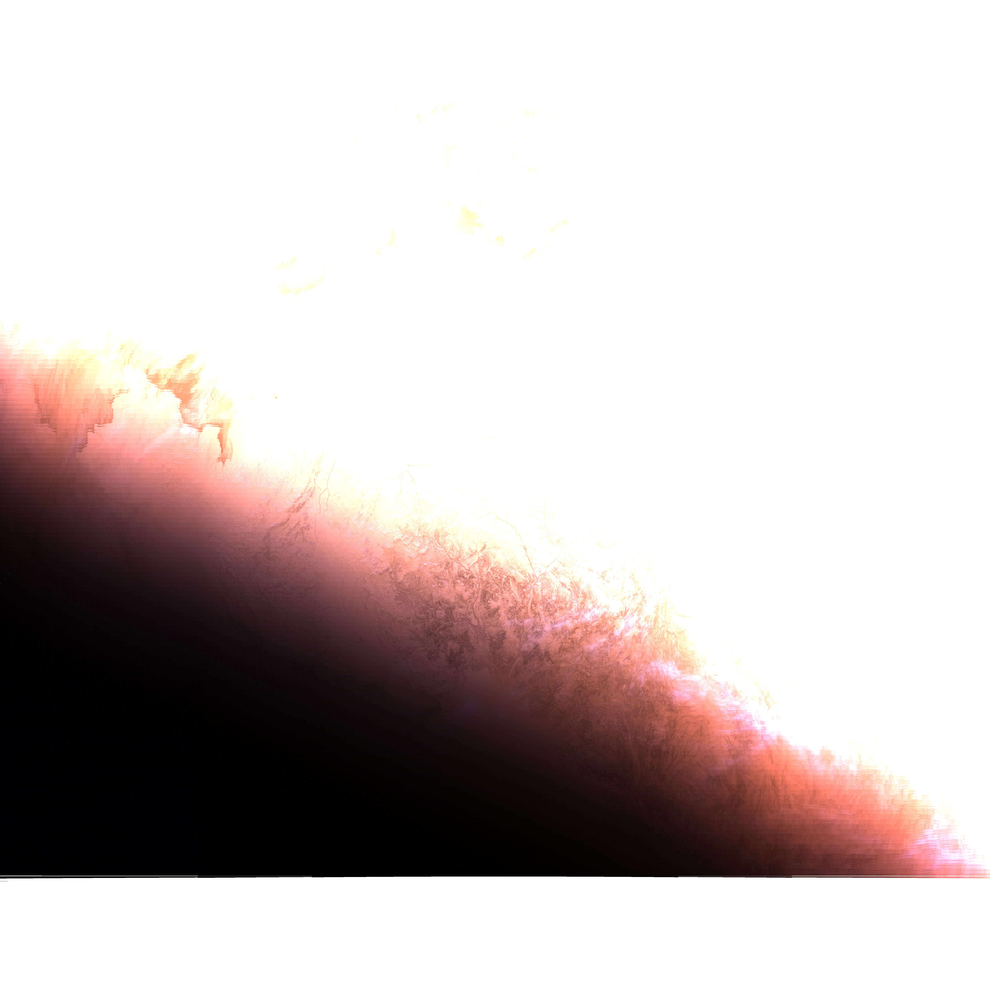

In [19]:
from satpy.writers import to_image
img = to_image(composite)
img.invert([False, False, False])
# # img.stretch("linear")
# # img.gamma(1.7)
img.show()



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pyproj

# Define the bounding box coordinates
western_lon = -160
eastern_lon = -130
southern_lat = 74
northern_lat = 77

# Create a Lambert Azimuthal Equal-Area Projection centered at the North Pole
proj_params = {
    "proj": "laea",
    "lat_0": 90,  # North Pole
    "lon_0": (western_lon + eastern_lon) / 2,
    "x_0": 0,
    "y_0": 0,
    "ellps": "WGS84",
}


In [ ]:
ccrs.AlbersEqualArea?

In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.feature import OCEAN
import numpy as np
import warnings

warnings.filterwarnings('ignore')

projections = [ccrs.PlateCarree(-60), ccrs.AlbersEqualArea(-60), ccrs.TransverseMercator(-60), ccrs.Stereographic(75,-145)]
titles = ['Equirectangular projection', 
          'Albers equal-area conic projection', 
          'Transverse mercator projection', 
          'Orthographic projection']

# fig, axes = plt.subplots(2, 2, figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})

fig = plt.figure()
axes = []
axes.append(fig.add_subplot(221, projection=projections[0]))
axes.append(fig.add_subplot(222, projection=projections[1]))
axes.append(fig.add_subplot(223, projection=projections[2]))
axes.append(fig.add_subplot(224, projection=projections[3]))

ny_lon, ny_lat = -75, 43

for ax, proj, title in zip(axes, projections, titles):
    ax.projection = proj  # Set the projection using the projection attribute
    ax.set_title(title)
    ax.set_global()
    ax.coastlines()
    ax.add_feature(OCEAN)
    ax.tissot(facecolor='r', alpha=.8, lats=np.arange(-90, 90, 30))
    ax.plot(ny_lon, ny_lat, 'ko', transform=ccrs.Geodetic())
    ax.text(ny_lon + 4, ny_lat + 4, 'New York', transform=ccrs.Geodetic())
    ax.gridlines(color='.25', ylocs=np.arange(-90, 90, 30))

plt.tight_layout()
plt.show()

In [ ]:
ax.set